# CNN Shoe Classification with TensorFlow and Keras

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

In [4]:
train_data_dir = "C:\\Users\\Retheck\\Downloads\\train"
test_data_dir="C:\\Users\\Retheck\\Downloads\\test"

In [5]:
train_data_dir

'C:\\Users\\Retheck\\Downloads\\train'

In [6]:
test_data_dir

'C:\\Users\\Retheck\\Downloads\\test'

#  Defining image dimensions and other hyperparameters

In [7]:
img_width, img_height = 150, 150 
batch_size = 32 
epochs = 10

#  Preprocessing and data augmentation for train set

In [8]:
train_datagen = ImageDataGenerator( rescale=1.0 / 255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)

In [9]:
train_generator = train_datagen.flow_from_directory( 
    train_data_dir, 
    target_size=(img_width, img_height), 
    batch_size=batch_size, 
    class_mode='categorical' )

Found 778 images belonging to 3 classes.


#  Building the CNN model

In [10]:
model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))

C:\Users\Retheck\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [11]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [12]:
# Model Training

model.fit(train_generator, epochs=epochs)

Epoch 1/10


C:\Users\Retheck\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


25/25 ━━━━━━━━━━━━━━━━━━━━ 43s 1s/step - accuracy: 0.4348 - loss: 1.5268
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.8195 - loss: 0.4564
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.8158 - loss: 0.3916
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.8565 - loss: 0.3232
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.8762 - loss: 0.3053
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.8506 - loss: 0.3123
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.9291 - loss: 0.2172
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.9199 - loss: 0.2010
Epoch 9/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.9182 - loss: 0.2061
Epoch 10/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 30s 1s/step - accuracy: 0.9223 - loss: 0.1968


#  Evaluation on training data

In [13]:
train_loss, train_accuracy = model.evaluate(train_generator)
print(f"Training Loss: {train_loss:.4f}, Training Accuracy: {train_accuracy:.4f}")

25/25 ━━━━━━━━━━━━━━━━━━━━ 21s 838ms/step - accuracy: 0.9420 - loss: 0.1442
Training Loss: 0.1375, Training Accuracy: 0.9473


#  Preprocessing the test set 

In [15]:
def preprocess_test_images(data_dir):
    images = []
    for image_name in os.listdir(data_dir):
        image_path = os.path.join(data_dir, image_name)
        image = load_img(image_path, target_size=(img_width, img_height))
        image_array = img_to_array(image) / 255.0
        images.append(image_array)
    return np.array(images)

In [16]:
test_images = preprocess_test_images(test_data_dir)

#  Predicting labels for test data

In [17]:
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step


In [18]:
predicted_labels

array([1, 0, 0, 2, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       0, 1, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 2, 2, 1, 1, 2, 1, 1, 2, 2, 0, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1,
       0, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 1, 1, 1, 2,
       1], dtype=int64)

#  Displaying some test images along with predicted labels

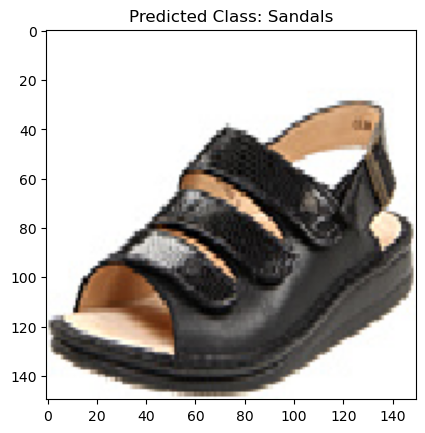

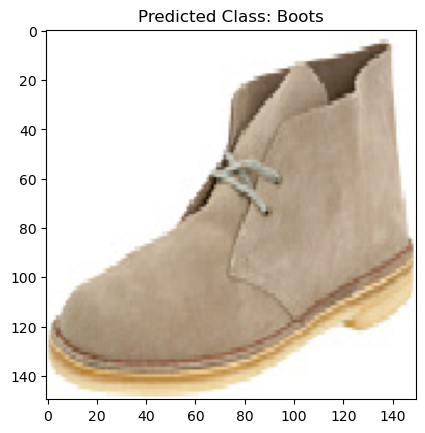

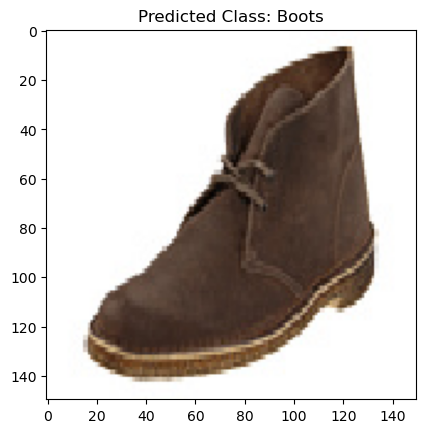

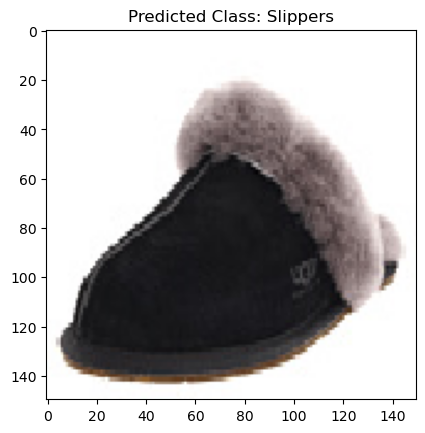

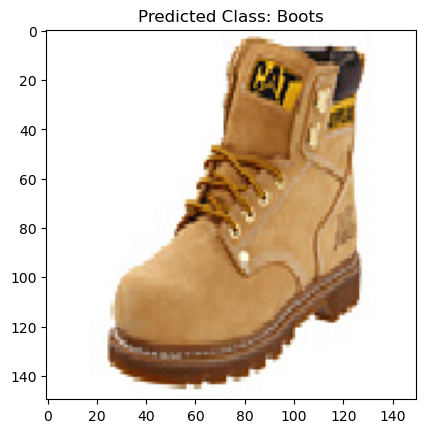

...

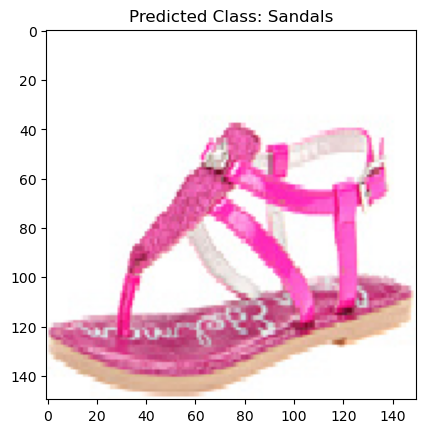

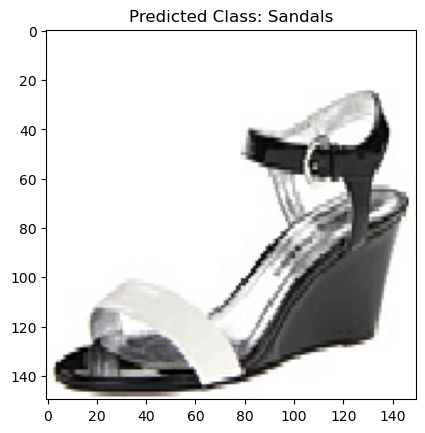

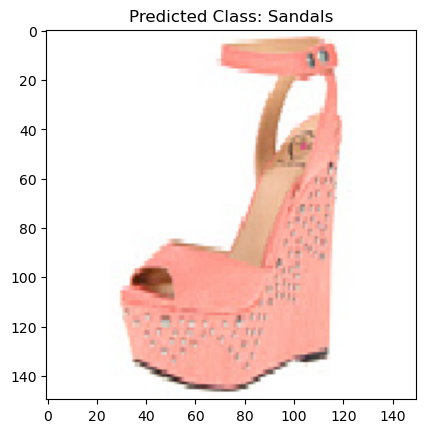

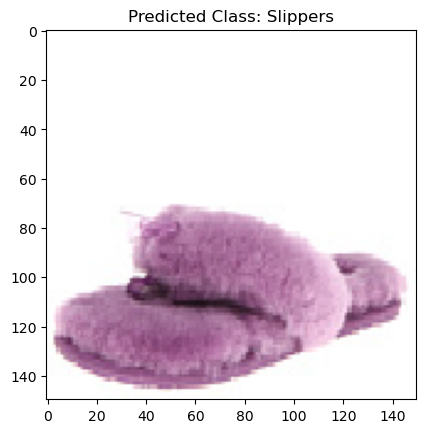

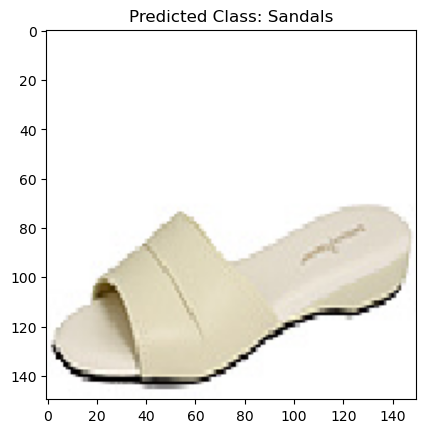

In [19]:
class_names = {0: 'Boots', 1: 'Sandals', 2: 'Slippers'}

for i in range(len(test_images)):
    plt.imshow(test_images[i])
    predicted_class = class_names[predicted_labels[i]]
    plt.title(f"Predicted Class: {predicted_class}")
    plt.show()

so, from the above we can see that  the model is performing well during training. With a training accuracy of 95.76% and a relatively low training loss of 0.0993, it seems that the model is learning the underlying patterns in the training data effectively. 